In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from shapely.geometry import Point
import geopandas as gpd
import geojsoncontour
import json
import folium
from airport_risk import calculate_risk_contours, plot_airport_risk

In [2]:
def convert_to_utm(x,y):
    '''
    Converts wgs84 coordinate system to utm coordinates
    '''
    point = gpd.GeoSeries([Point(x, y)],crs="epsg:4326").to_crs("epsg:5243").values[0]
    return point.x,point.y

## Calculate the risk

**Geometric likelihood of an accident at a given point:**
<font size="5">
 
$ p(\theta, r) = k . e ^{-\big(\frac{r}{r_0} + \frac{|\theta|}{\theta_0}\big)}$
</font>

In [34]:
A = {
    "r0": 5000, ## unit is KM
    "theta0": 5, ## unit is degrees
    "k": 0.23, ## constant
    "LA": 0.02*10**-6, ## likelihood of an accident
    "YM": 212235, ## Year movements at airport
    "dirs": 6 ## Total directions
}
## Calculate the airport likelihood at the airport, given the airport constants
A['P'] = A["LA"]*A["YM"]/A["dirs"]

frankfurt_airport = {
    "runways": {
        "L": {
            "A": (8.497104, 50.037093),
            "B": (8.533707, 50.045829)
        },
        "R": {
            "A":(8.534249, 50.027578),
            "B":(8.586519, 50.040053)
        },
        "C": {
            "A": (8.534724, 50.032642),
            "B": (8.587042, 50.045163)
        },
        "D": {
            "A" : (8.525902, 50.034182),
            "B" : (8.526343, 49.998493)
        }
    },  
    "epsg": 5243,
    "A": A
}

dallas_airport = {
    "title": "Dallas Airport",
    "runways": {
        "13R/31L": {
            "A": (-97.08322, 32.90963),
            "B": (-97.06329, 32.89029)
        },
        "18R/36L": {
            "A":(-97.05465, 32.91582),
            "B":(-97.05485, 32.87902)
        },
        "18L/36R": {
            "A": (-97.05074, 32.91581),
            "B": (-97.05092, 32.87899)
        },
        "17R/35L": {
            "A" : (-97.02989, 32.91569),
            "B" : (-97.03009, 32.87891)
        },
        "17C/35C": {
            "A": (-97.02599, 32.91569),
            "B": (-97.02618, 32.87886)
        },
        "17L/35R": {
            "A": (-97.00978, 32.89835),
            "B": (-97.00992, 32.87497)
        },
        "13L/31R": {
            "A": (-97.02005, 32.91132),
            "B": (-97.00085, 32.895)
        }
    },  
    "epsg": 3486,
    "A": A
}

contour_config = {
    "DI" : 10, ## distance_interval
    "DL": 30000, ## maximum distance of the contour
    "AI": 5, ## Angle intervals
    "AL": 60 ## maximum angle of the contour
} 

## plot contours

In [5]:
def fmt(x, pos):
    b = '{:.2e}'.format(x).split('e')[1]
    b = int(b)
    return r'$10^{{{}}}$'.format(b)

values = [10**-i for i in range(3,10)][::-1]
colors = ['black', 'darkgreen', 'yellow', 'red', 'purple', 'cyan']
labels = [-1*int("{:.0e}".format(x).split("e-0")[1]) for x in values]

print(colors)
print(values)
print(labels)

['black', 'darkgreen', 'yellow', 'red', 'purple', 'cyan']
[1e-09, 1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001]
[-9, -8, -7, -6, -5, -4, -3]


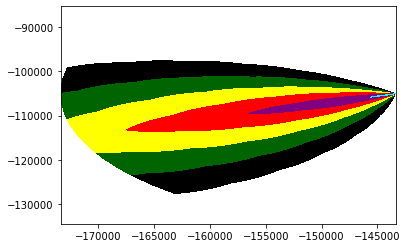

In [6]:
contour_utm1 = plt.contourf(X1,Y1,Z1, levels=values, colors=colors, vmin=min(values), vmax=max(values))

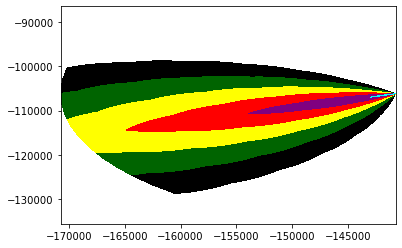

In [7]:
contour_utm2 = plt.contourf(X2,Y2,Z2, levels=values, colors=colors, vmin=min(values), vmax=max(values))

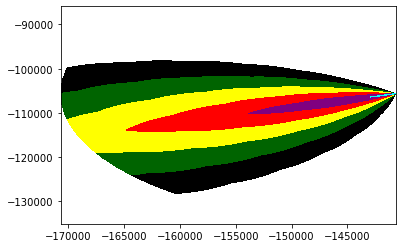

In [8]:
contour_utm3 = plt.contourf(X3,Y3,Z3, levels=values, colors=colors, vmin=min(values), vmax=max(values))

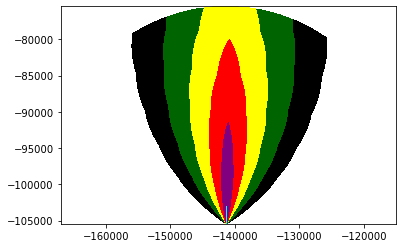

In [9]:
contour_utm4 = plt.contourf(X4,Y4,Z4, levels=values, colors=colors, vmin=min(values), vmax=max(values))

## Converting contours to geodataframe
**Plot in utm coordinates:**

In [10]:
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contour_utm1)

c1 = json.loads(geojson)

In [11]:
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contour_utm2)

c2 = json.loads(geojson)

In [12]:
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contour_utm3)

c3 = json.loads(geojson)

In [13]:
geojson = geojsoncontour.contourf_to_geojson(
    contourf=contour_utm4)

c4 = json.loads(geojson)

In [14]:
gdf1 = gpd.GeoDataFrame.from_features(c1, crs="epsg:5243")
gdf1["title"] = [x for x in range(-9,-3,1)]
gdf1.drop(["stroke","stroke-opacity","stroke-width"], axis=1, inplace=True)

gdf2 = gpd.GeoDataFrame.from_features(c2, crs="epsg:5243")
gdf2.drop(["stroke","stroke-opacity","stroke-width"], axis=1, inplace=True)
gdf2["title"] = [x for x in range(-9,-3,1)]

gdf3 = gpd.GeoDataFrame.from_features(c3, crs="epsg:5243")
gdf3.drop(["stroke","stroke-opacity","stroke-width"], axis=1, inplace=True)
gdf3["title"] = [x for x in range(-9,-3,1)]

gdf4 = gpd.GeoDataFrame.from_features(c4, crs="epsg:5243")
gdf4.drop(["stroke","stroke-opacity","stroke-width"], axis=1, inplace=True)
gdf4["title"] = [x for x in range(-9,-3,1)]

In [15]:
gdf4.shape

(6, 4)

In [16]:
gdf3

,geometry,fill,fill-opacity,title
0,"MULTIPOLYGON (((-140699.498 -105621.017, -1407...",#000000,0.9,-9
1,"MULTIPOLYGON (((-140701.726 -105624.149, -1407...",#006400,0.9,-8
2,"MULTIPOLYGON (((-140703.359 -105627.767, -1407...",#ffff00,0.9,-7
3,"MULTIPOLYGON (((-140704.281 -105631.803, -1407...",#ff0000,0.9,-6
4,"MULTIPOLYGON (((-140704.358 -105635.760, -1407...",#800080,0.9,-5
5,"MULTIPOLYGON (((-140703.653 -105639.623, -1407...",#00ffff,0.9,-4


In [17]:
L1,L2 = (3,10)
colors = ['black', 'darkgreen', 'yellow', 'red', 'purple', 'cyan']
color_dict = {}
for level,c in zip(range(-(L2-1),-L1,1), colors):
    color_dict[level]=c
color_dict

{-9: 'black',
 -8: 'darkgreen',
 -7: 'yellow',
 -6: 'red',
 -5: 'purple',
 -4: 'cyan'}

In [18]:
color_dict[-4]

'cyan'

In [19]:
colors = {
    -9: "black",
    -8: "green",
    -7: "yellow",
    -6: "red",
    -5: "purple",
    -4: "cyan"
}

In [20]:
gdf1

,geometry,fill,fill-opacity,title
0,"MULTIPOLYGON (((-143378.375 -105053.797, -1433...",#000000,0.9,-9
1,"MULTIPOLYGON (((-143380.608 -105056.927, -1433...",#006400,0.9,-8
2,"MULTIPOLYGON (((-143382.246 -105060.542, -1433...",#ffff00,0.9,-7
3,"MULTIPOLYGON (((-143383.175 -105064.577, -1433...",#ff0000,0.9,-6
4,"MULTIPOLYGON (((-143383.257 -105068.534, -1433...",#800080,0.9,-5
5,"MULTIPOLYGON (((-143382.558 -105072.398, -1433...",#00ffff,0.9,-4


In [21]:
udf1 = gpd.overlay(gdf1,gdf2, how='union', keep_geom_type=True)
udf1['title'] = np.max(udf1[["title_1","title_2"]].fillna(-99).values, axis=1)
udf1["fill"] = udf1["title"].apply(lambda x: colors[x])
udf1 = udf1[["geometry", "title", "fill"]]
udf1

,geometry,title,fill
0,"MULTIPOLYGON (((-149125.864 -101067.426, -1491...",-9.0,black
1,"POLYGON ((-170605.717 -103695.673, -170595.354...",-8.0,green
2,"MULTIPOLYGON (((-143508.955 -105417.652, -1435...",-8.0,green
3,"MULTIPOLYGON (((-143587.243 -105397.975, -1435...",-8.0,green
4,"MULTIPOLYGON (((-143680.791 -105371.614, -1436...",-7.0,yellow
5,"MULTIPOLYGON (((-143800.569 -105347.813, -1437...",-6.0,red
6,"MULTIPOLYGON (((-143987.647 -105308.370, -1439...",-5.0,purple
7,"POLYGON ((-144091.202 -105283.095, -144081.667...",-4.0,cyan
8,"MULTIPOLYGON (((-143438.700 -105439.356, -1434...",-7.0,yellow
9,"MULTIPOLYGON (((-143512.840 -105426.857, -1435...",-7.0,yellow


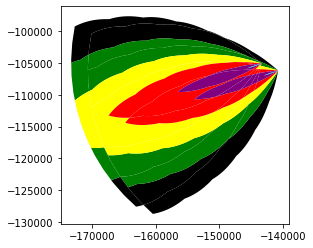

In [22]:
udf1.plot(color=udf1["fill"])

In [23]:
udf2 = gpd.overlay(udf1, gdf3, how='union')
udf2['title'] = np.max(udf2[["title_1","title_2"]].fillna(-99).values, axis=1)
udf2["fill"] = udf2["title"].apply(lambda x: colors[x])
udf2 = udf2[["geometry", "title", "fill"]]
udf2

<ipython-input-23-7ef184e0bbe8>:1: UserWarning: `keep_geom_type=True` in overlay resulted in 2 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  udf2 = gpd.overlay(udf1, gdf3, how='union')


,geometry,title,fill
0,"MULTIPOLYGON (((-149117.064 -101072.237, -1491...",-9.0,black
1,"POLYGON ((-170584.991 -103684.846, -170574.630...",-8.0,green
2,"POLYGON ((-147870.704 -115963.007, -147876.100...",-8.0,green
3,"POLYGON ((-156868.833 -98426.674, -156859.239 ...",-9.0,black
4,"MULTIPOLYGON (((-140861.608 -106084.205, -1408...",-9.0,black
...,...,...,...
112,"MULTIPOLYGON (((-140907.851 -105965.506, -1409...",-8.0,green
113,"MULTIPOLYGON (((-140972.302 -105911.850, -1409...",-7.0,yellow
114,"MULTIPOLYGON (((-141036.947 -105862.023, -1410...",-6.0,red
115,"MULTIPOLYGON (((-141112.151 -105802.254, -1411...",-5.0,purple


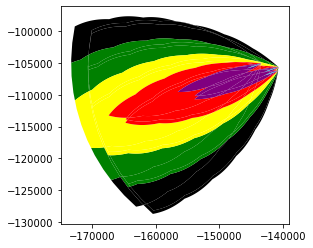

In [24]:
udf2.plot(color=udf2["fill"])
plt.show()

Convert the CRS of geodataframe of union of contours to WGS84:

In [25]:
gdf4

,geometry,fill,fill-opacity,title
0,"MULTIPOLYGON (((-141293.704 -105436.472, -1412...",#000000,0.9,-9
1,"MULTIPOLYGON (((-141295.888 -105433.309, -1412...",#006400,0.9,-8
2,"MULTIPOLYGON (((-141298.731 -105430.540, -1412...",#ffff00,0.9,-7
3,"MULTIPOLYGON (((-141302.211 -105428.295, -1412...",#ff0000,0.9,-6
4,"MULTIPOLYGON (((-141305.904 -105426.872, -1413...",#800080,0.9,-5
5,"MULTIPOLYGON (((-141309.775 -105426.216, -1413...",#00ffff,0.9,-4


In [26]:
udf2

,geometry,title,fill
0,"MULTIPOLYGON (((-149117.064 -101072.237, -1491...",-9.0,black
1,"POLYGON ((-170584.991 -103684.846, -170574.630...",-8.0,green
2,"POLYGON ((-147870.704 -115963.007, -147876.100...",-8.0,green
3,"POLYGON ((-156868.833 -98426.674, -156859.239 ...",-9.0,black
4,"MULTIPOLYGON (((-140861.608 -106084.205, -1408...",-9.0,black
...,...,...,...
112,"MULTIPOLYGON (((-140907.851 -105965.506, -1409...",-8.0,green
113,"MULTIPOLYGON (((-140972.302 -105911.850, -1409...",-7.0,yellow
114,"MULTIPOLYGON (((-141036.947 -105862.023, -1410...",-6.0,red
115,"MULTIPOLYGON (((-141112.151 -105802.254, -1411...",-5.0,purple


In [27]:
udf3 = gpd.overlay(udf2, gdf4, how='union')
udf3['title'] = np.max(udf3[["title_1","title_2"]].fillna(-99).values, axis=1)
udf3["fill"] = udf3["title"].apply(lambda x: colors[x])
udf3 = udf3[["geometry", "title", "fill"]]
udf3

<ipython-input-27-f385fd641fc3>:1: UserWarning: `keep_geom_type=True` in overlay resulted in 5 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  udf3 = gpd.overlay(udf2, gdf4, how='union')


,geometry,title,fill
0,"POLYGON ((-143530.191 -103998.429, -143521.876...",-9.0,black
1,"MULTIPOLYGON (((-141100.756 -105274.964, -1410...",-9.0,black
2,"MULTIPOLYGON (((-141188.267 -105347.796, -1411...",-8.0,green
3,"MULTIPOLYGON (((-141293.725 -105436.484, -1413...",-7.0,yellow
4,"MULTIPOLYGON (((-141138.817 -105242.576, -1411...",-8.0,green
...,...,...,...
137,"MULTIPOLYGON (((-141131.474 -105218.909, -1411...",-8.0,green
138,"MULTIPOLYGON (((-141916.769 -104589.318, -1419...",-7.0,yellow
139,"POLYGON ((-141565.599 -104869.843, -141569.574...",-6.0,red
140,"MULTIPOLYGON (((-141415.931 -104988.264, -1414...",-5.0,purple


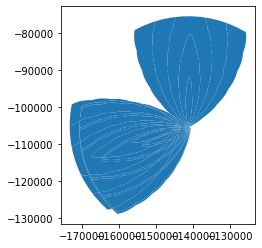

In [28]:
udf3.plot()

In [29]:
final = udf3.to_crs("epsg:4326")
final.head()

,geometry,title,fill
0,"POLYGON ((8.49437 50.04666, 8.49449 50.04661, ...",-9.0,black
1,"MULTIPOLYGON (((8.52878 50.03577, 8.52889 50.0...",-9.0,black
2,"MULTIPOLYGON (((8.52758 50.03510, 8.52771 50.0...",-8.0,green
3,"MULTIPOLYGON (((8.52614 50.03427, 8.52602 50.0...",-7.0,yellow
4,"MULTIPOLYGON (((8.52823 50.03605, 8.52834 50.0...",-8.0,green


## Automating the union of contours

```python
[1,2,3,4,5,6,7,8]
[a,3,4,5,6,7,8]
[b,4,5,6,7,8]
[c,5,6,7,8]....
[g]
```

In [30]:
%%time
gdfs = [gdf1,gdf2, gdf3, gdf4]

while len(gdfs) != 1:
    gdfs[0] = gpd.overlay(gdfs[0], gdfs[1], how="union", keep_geom_type=True)
    gdfs[0]['title'] = np.max(gdfs[0][["title_1","title_2"]].fillna(-99).values, axis=1)
    gdfs[0]["fill"] = gdfs[0]["title"].apply(lambda x: colors[x])
    gdfs[0] = gdfs[0][["geometry", "title", "fill"]]
    del gdfs[1]
    
final_gdf = gdfs[0].to_crs("epsg:4326")
final_gdf

Wall time: 9.11 s


,geometry,title,fill
0,"POLYGON ((8.49437 50.04666, 8.49449 50.04661, ...",-9.0,black
1,"MULTIPOLYGON (((8.52878 50.03577, 8.52889 50.0...",-9.0,black
2,"MULTIPOLYGON (((8.52758 50.03510, 8.52771 50.0...",-8.0,green
3,"MULTIPOLYGON (((8.52614 50.03427, 8.52602 50.0...",-7.0,yellow
4,"MULTIPOLYGON (((8.52823 50.03605, 8.52834 50.0...",-8.0,green
...,...,...,...
137,"MULTIPOLYGON (((8.52833 50.03627, 8.52841 50.0...",-8.0,green
138,"MULTIPOLYGON (((8.51712 50.04174, 8.51704 50.0...",-7.0,yellow
139,"POLYGON ((8.52213 50.03930, 8.52207 50.03939, ...",-6.0,red
140,"MULTIPOLYGON (((8.52427 50.03827, 8.52423 50.0...",-5.0,purple


In [31]:
%%time
d = json.loads(final_gdf.to_json())
d

Wall time: 2.04 s


{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'fill': 'black', 'title': -9.0},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[8.494366847651703, 50.04666234509087],
      [8.494485110791414, 50.04661402366763],
      [8.494603326615001, 50.04656566187314],
      [8.494721494971213, 50.046517259974884],
      [8.494839616139226, 50.04646881797793],
      [8.49495769039441, 50.04642033597726],
      [8.495075717589321, 50.04637181415044],
      [8.495193697999333, 50.04632325259248],
      [8.495311631760147, 50.04627465139589],
      [8.495429519003663, 50.04622601074318],
      [8.495547359729725, 50.04617733063446],
      [8.49566515421371, 50.04612861116474],
      [8.495782902587512, 50.04607985251646],
      [8.495900604843369, 50.04603105486969],
      [8.496018261124602, 50.04598221813705],
      [8.496135871702782, 50.04593334250347],
      [8.496253436570145, 50.045884428148966],
      [8.4963709558624, 50.045835475166

In [32]:
x0,y0 = 8.534724, 50.032642
m = folium.Map([y0,x0], zoom_start=12, tiles="openstreetmap")
folium.GeoJson(
    d,
    style_function=lambda x: {
        'color':     x['properties']['fill'],
        'opacity':   1,
        'weight' : 0
    }
                  
).add_to(m)
m